# Hands-on Image Processing with Python
## Chapter 4: Image Enhancement 

In [1]:
# Author: Sandipan Dey

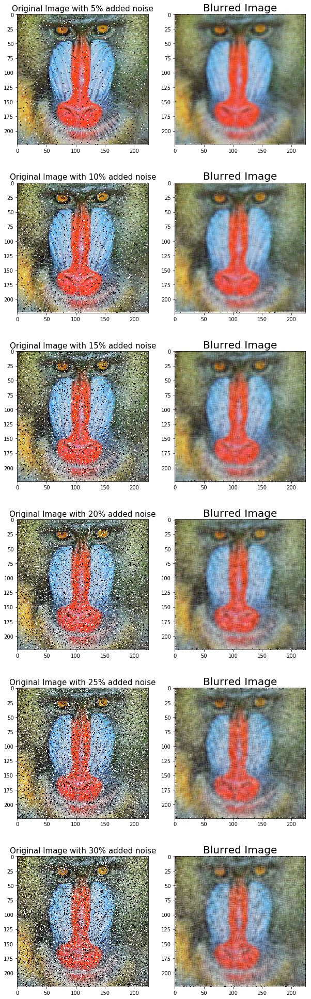

In [145]:
% matplotlib inline 
from PIL import Image, ImageFilter
import matplotlib.pylab as plt
import numpy as np
i = 1
plt.figure(figsize=(10,35))
for prop_noise in np.linspace(0.05,0.3,6):
    im = Image.open('../images/mandrill.jpg')
    #print(np.max(im))
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # geenrate salt-and-pepper noise
    im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    plt.subplot(6,2,i)
    plt.imshow(im)
    plt.title('Original Image with ' + str(int(100*prop_noise)) + '% added noise', size=15)
    i += 1
    im1 = im.filter(ImageFilter.BLUR)
    plt.subplot(6,2,i)
    plt.imshow(im1)
    plt.title('Blurred Image', size=20)
    i += 1
#im.show()

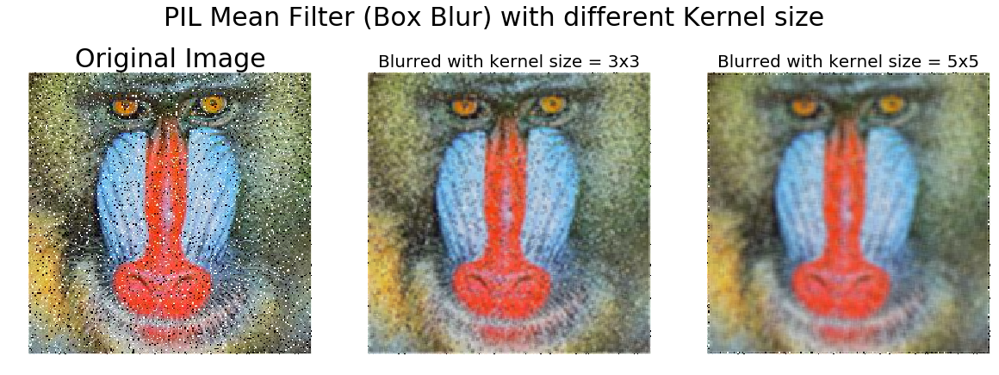

In [42]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.imshow(im)
plt.title('Original Image', size=30)
plt.axis('off')
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    #print(box_blur_kernel)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    plt.subplot(1,3,(2 if n==3 else 3))
    plt.imshow(im1)
    plt.title('Blurred with kernel size = ' + str(n) + 'x' + str(n), size=20)
    plt.axis('off')
plt.suptitle('PIL Mean Filter (Box Blur) with different Kernel size', size=30)
plt.show()

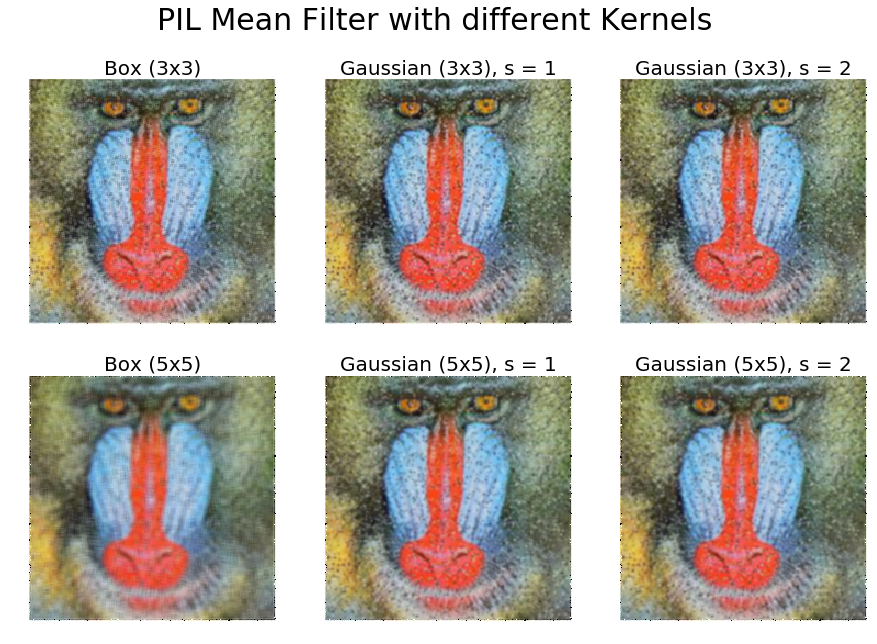

In [101]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
plt.figure(figsize=(15,10))
i = 1
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    #print(box_blur_kernel)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    plt.subplot(2,3,i)
    plt.imshow(im1)
    plt.title('Box (' + str(n) + 'x' + str(n) + ')', size=20)
    plt.axis('off')
    i += 1
    for sigma in [1,2]:
        gaussian_kernel = gaussian_kern(n // 2, sigma)
        im1 = im.filter(ImageFilter.Kernel((n,n), gaussian_kernel.flatten()))
        plt.subplot(2,3,i)
        plt.imshow(im1)
        plt.title('Gaussian (' + str(n) + 'x' + str(n) + '), s = ' + str(sigma), size=20)
        plt.axis('off')
        i += 1
plt.suptitle('PIL Mean Filter with different Kernels', size=30)
plt.show()

In [ ]:
import matplotlib.pylab as plt
import numpy as np
im = Image.open('../images/mandrill_spnoise_0.2.jpg')
plt.figure(figsize=(20,15))
i = 1
for radius in np.linspace(1, 3, 12): 
    im1 = im.filter(ImageFilter.GaussianBlur(radius))
    plt.subplot(3,4,i)
    i += 1
    plt.imshow(im1)
    plt.title('radius = ' + str(round(radius,2)), size=20)
    plt.axis('off')
plt.suptitle('PIL Gaussian Blur with different Radius', size=30)
plt.show()

In [ ]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
plt.figure(figsize=(15,10))
i = 1
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    #print(box_blur_kernel)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    plt.subplot(2,3,i)
    plt.imshow(im1)
    plt.title('Box (' + str(n) + 'x' + str(n) + ')', size=20)
    plt.axis('off')
    i += 1
    for sigma in [1,2]:
        gaussian_kernel = gaussian_kern(n // 2, sigma)
        im1 = im.filter(ImageFilter.Kernel((n,n), gaussian_kernel.flatten()))
        plt.subplot(2,3,i)
        plt.imshow(im1)
        plt.title('Gaussian (' + str(n) + 'x' + str(n) + '), s = ' + str(sigma), size=20)
        plt.axis('off')
        i += 1
plt.suptitle('PIL Mean Filter with different Kernels', size=30)
plt.show()

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\exposure\exposure.py:63: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warn("This might be a color image. The histogram will be "


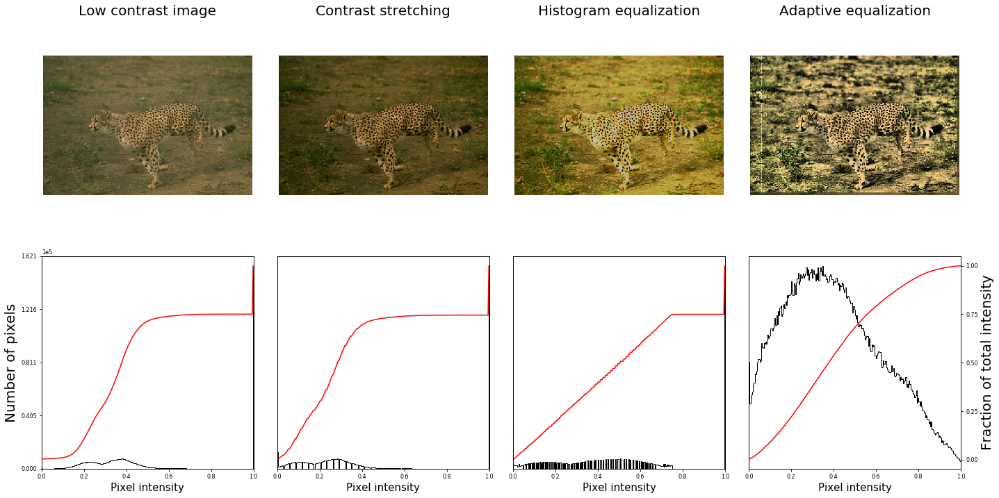

In [15]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from skimage import data, img_as_float
from skimage import exposure, io


matplotlib.rcParams['font.size'] = 8


def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity', size=15)
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf


# Load an example image
#img = data.moon()
img = io.imread('../images/cheetah.png') #beans_g

# Contrast stretching
p2, p98 = np.percentile(img, (2, 98))
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))

# Equalization
img_eq = exposure.equalize_hist(img)

# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)

# Display results
fig = plt.figure(figsize=(20, 10))
axes = np.zeros((2, 4), dtype=np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
ax_img.set_title('Low contrast image', size=20)

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels', size=20)
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale, axes[:, 1])
ax_img.set_title('Contrast stretching', size=20)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq, axes[:, 2])
ax_img.set_title('Histogram equalization', size=20)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 3])
ax_img.set_title('Adaptive equalization', size=20)

ax_cdf.set_ylabel('Fraction of total intensity', size=20)
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pylab as plt
import numpy as np
i = 1
plt.figure(figsize=(20,35))
for prop_noise in np.linspace(0.05,0.3,6):
    im = Image.open('../images/mandrill.jpg')
    #print(np.max(im))
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # geenrate salt-and-pepper noise
    im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    plt.subplot(6,4,i)
    plt.imshow(im)
    plt.title('Original Image with ' + str(int(100*prop_noise)) + '% added noise', size=15)
    i += 1
    for sz in [3,7,11]:
        im1 = im.filter(ImageFilter.MedianFilter(size=sz)) 
        plt.subplot(6,4,i)
        plt.imshow(im1)
        plt.title('Output (Median Filter size=' + str(sz) + ')', size=15) #  Mode 
        i += 1

In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pylab as plt
import numpy as np
plt.figure(figsize=(20,10))
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
plt.subplot(1,4,1)
plt.imshow(im)
plt.title('Original Image with 10% added noise', size=15)
i = 2
for sz in [3,7,11]:
    im1 = im.filter(ImageFilter.ModeFilter(size=sz)) #MedianFilter(size=3) ModeFilter
    plt.subplot(1,4,i)
    plt.imshow(im1)
    plt.title('Output (Mode Filter size=' + str(sz) + ')', size=15) #  Mode Median
    i += 1

In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pylab as plt
import numpy as np
plt.figure(figsize=(20,10))
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
plt.subplot(1,3,1)
plt.imshow(im)
plt.title('Original Image with 10% added noise', size=15)
im1 = im.filter(ImageFilter.MaxFilter(size=sz)) 
plt.subplot(1,3,2)
plt.imshow(im1)
plt.title('Output (Max Filter size=' + str(sz) + ')', size=15) 
im1 = im1.filter(ImageFilter.MinFilter(size=sz)) 
plt.subplot(1,3,3)
plt.imshow(im1)
plt.title('Output (Min Filter size=' + str(sz) + ')', size=15) 

10.9753734511


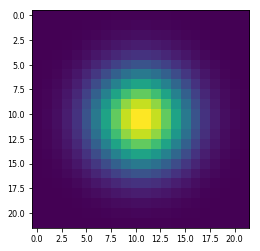

In [77]:
import numpy as np
import scipy.stats as st

def gkern(kernlen=21, nsig=3):
    """Returns a 2D Gaussian kernel array."""

    interval = (2*nsig+1.)/(kernlen)
    x = np.linspace(-nsig-interval/2., nsig+interval/2., kernlen+1)
    kern1d = st.norm.pdf(x) #np.diff(st.norm.cdf(x))
    kernel_raw = np.outer(kern1d, kern1d)
    kernel = kernel_raw /kernel_raw.sum()
    print(kernel_raw.sum())
    return kernel

import matplotlib.pyplot as plt
plt.imshow(gkern(21), interpolation='none')

In [ ]:
import matplotlib.pyplot as plt

from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float, io, color
from skimage.util import random_noise

im = color.rgb2gray(img_as_float(io.imread('../images/mountain.png')))
io.imsave('../images/mountain_g.png', im)
sigma = 0.155
noisy = random_noise(im, var=sigma**2)
plt.imshow(noisy)

In [ ]:
plt.figure(figsize=(20,15))
i = 1
for sigma_sp in [5, 10, 20]:
    for sigma_col in [0.1, 0.25, 5]:
        plt.subplot(3,3,i)
        plt.imshow(denoise_bilateral(noisy, sigma_color=sigma_col, sigma_spatial=sigma_sp, multichannel=False))
        plt.title(r'$\sigma_r=$' + str(sigma_col) + r', $\sigma_s=$' + str(sigma_sp), size=20)
        i += 1
plt.show()

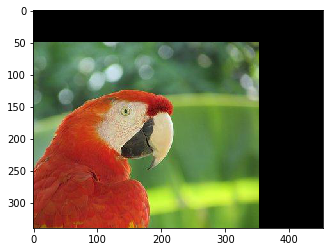

In [29]:
def translate(xy, t_x, t_y):
    xy[:, 0] -= t_y
    xy[:, 1] -= t_x
    return xy
im = imread('../new images/parrot.jpg')
im = warp(im, translate, map_args={'t_x':50, 't_y':-100})
plt.imshow(im)
plt.show()

In [34]:
from PIL import ImageEnhance

enhancer = ImageEnhance.Sharpness(im)

for i in range(8):
    factor = i / 4.0
    enhancer.enhance(factor).show("Sharpness %f" % factor)

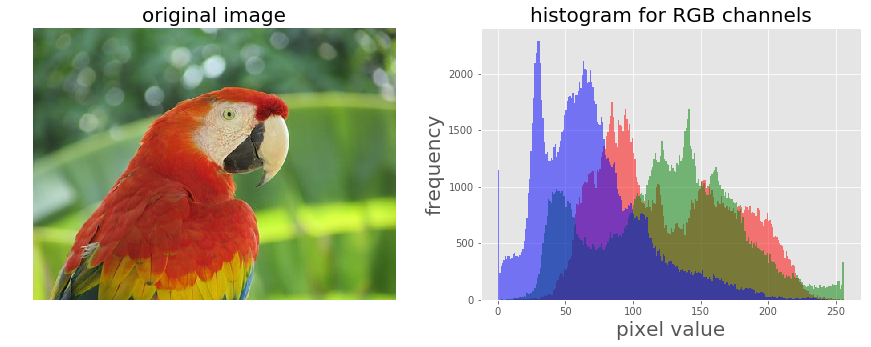

In [788]:
im = Image.open("../new images/parrot.png")
im_r, im_g, im_b = im.split()

plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.title('original image', size=20)
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im_r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im_g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im_b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.title('histogram for RGB channels', size=20)
plt.show()

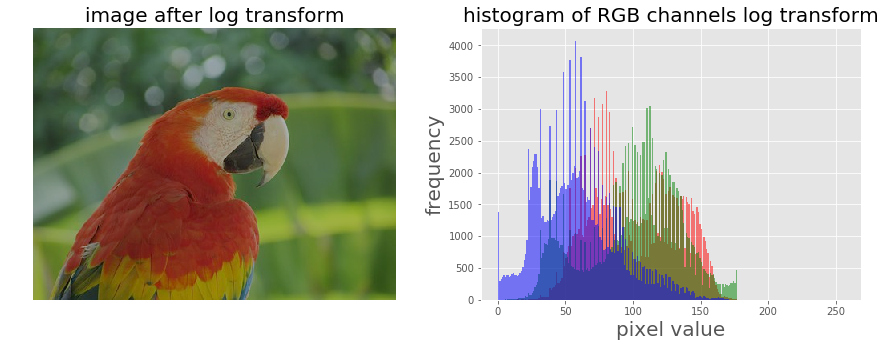

In [789]:
im = im.point(lambda i: 255*np.log(1+i/255))
im_r, im_g, im_b = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.title('image after log transform', size=20)
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im_r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im_g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im_b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.title('histogram of RGB channels log transform', size=20)
plt.show()

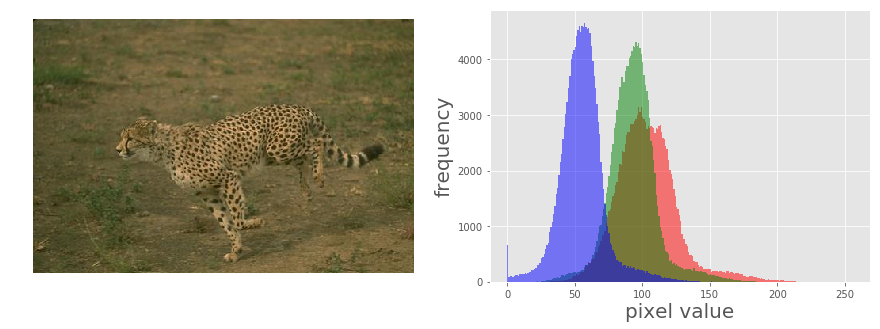

In [135]:
im = imread("../images/cheetah.png")

plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im[...,0]).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im[...,1]).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im[...,2]).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
#plt.hist(np.array(im[...,3]).ravel(), bins=256, range=(0, 256), color='k', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.show()

In [136]:
np.max(im)

255

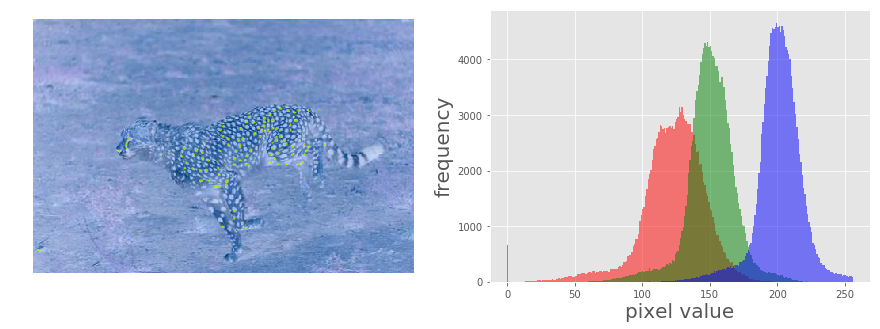

In [137]:
for i in range(3):
    im[...,i] = 255*((im[...,i]-np.min(im[...,i])/(np.max(im[...,i])-np.min(im[...,i]))))
    
plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im[...,0]).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im[...,1]).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im[...,2]).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
#plt.hist(np.array(im[...,3]).ravel(), bins=256, range=(0, 256), color='k', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.show()

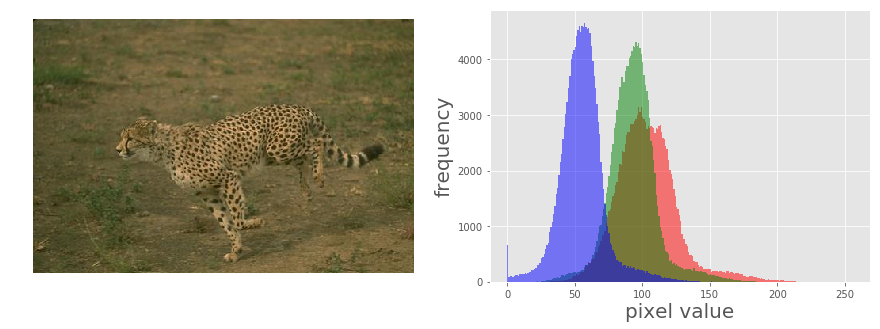

In [263]:
im = Image.open("../images/cheetah.png")
im_r, im_g, im_b, _ = im.split()

plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im_r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im_g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im_b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.show()

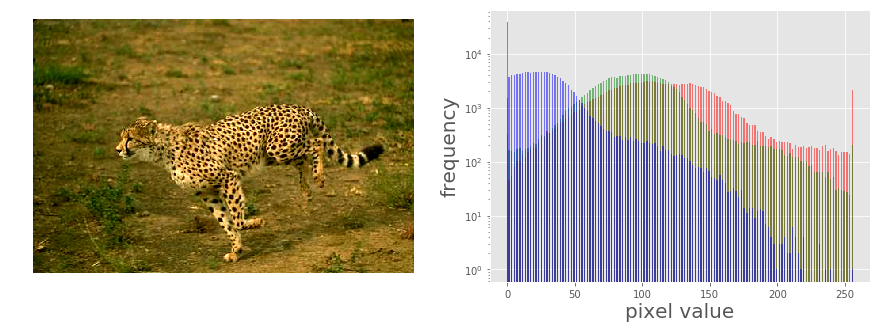

In [266]:
from PIL import Image, ImageEnhance
contrast = ImageEnhance.Contrast(im)
im1 = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8), (im.height, im.width, 4)) #.show()

plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im1, cmap='gray')
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im1[...,0]).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im1[...,1]).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im1[...,2]).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.yscale('log',basey=10) 
plt.show()

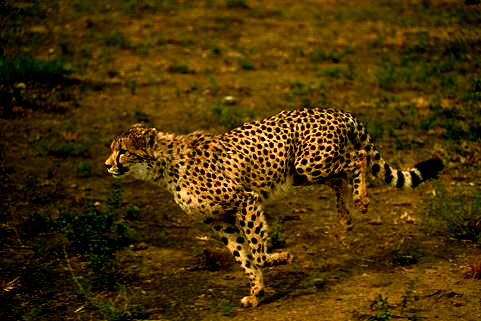

In [161]:
def change_contrast(img, level):
    factor = (259 * (level + 255)) / (255 * (259 - level))
    def contrast(c):
        return 128 + factor * (c - 128)
    return img.point(contrast)

change_contrast(im, 100)

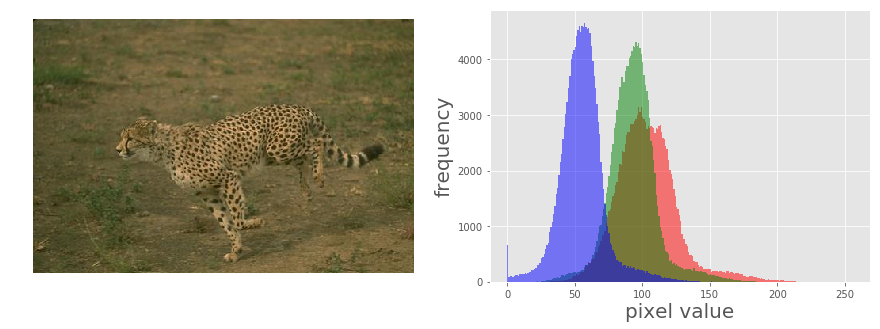

In [210]:
im = Image.open("../images/cheetah.png")
im_r, im_g, im_b, _ = im.split()

plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im_r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im_g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im_b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.show()

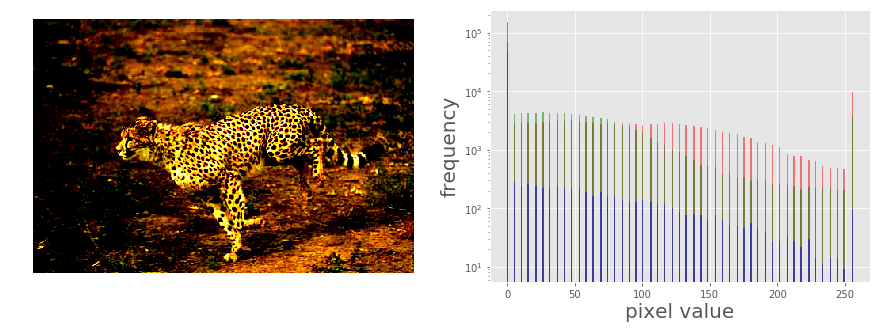

In [245]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48)
 
im = im.point(contrast)
im_r, im_g, im_b, _ = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(im, cmap='gray')
plt.axis('off')
plt.subplot(122)
plt.hist(np.array(im_r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
plt.hist(np.array(im_g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
plt.hist(np.array(im_b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
plt.xlabel('pixel value', size=20)
plt.ylabel('frequency', size=20)
plt.yscale('log',basey=10) 
plt.show()

In [85]:
def plot_images_side_by_side(original, filtered, filter_name, sz=(18,7)):
    plt.gray()
    plt.figure(figsize=sz)
    plt.subplot(121)
    plt.imshow(original)
    plt.title('original', size=20)
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(filtered)
    plt.title(filter_name, size=20)
    plt.axis('off')
    plt.show()

(350, 622, 3)


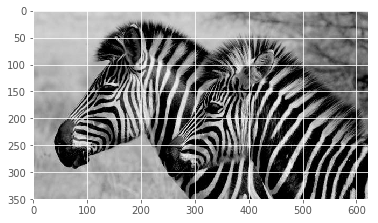

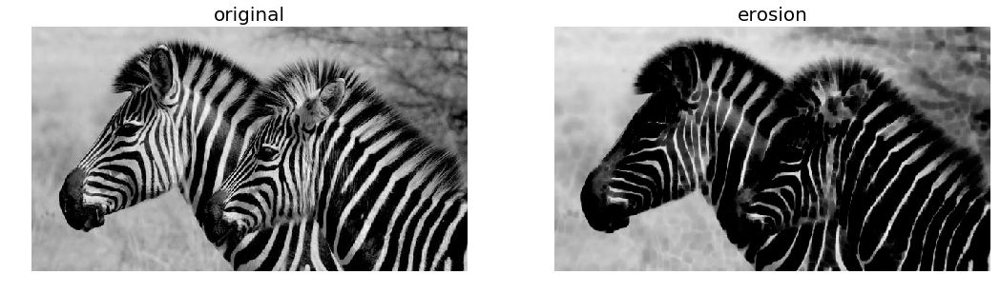

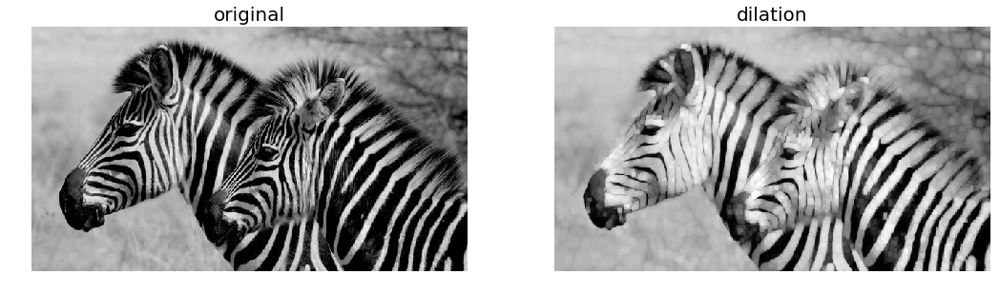

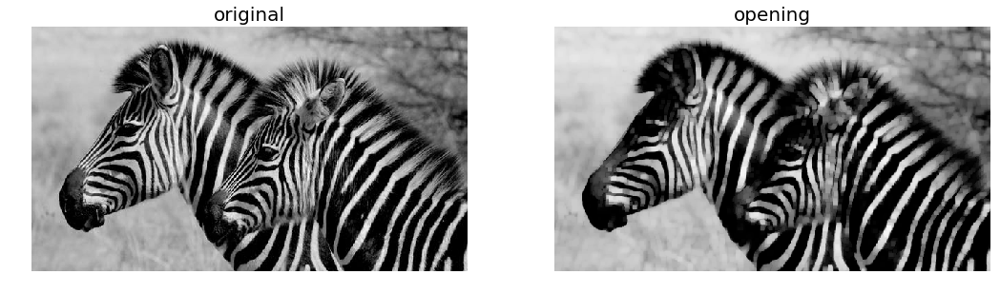

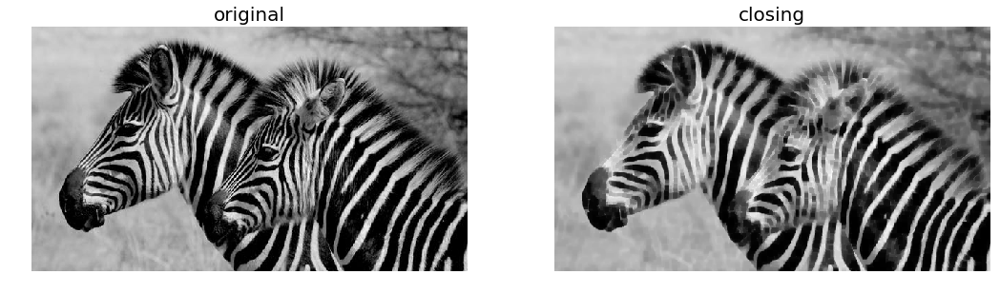

In [384]:
from skimage.morphology import erosion, dilation, opening, closing, white_tophat
from skimage.morphology import black_tophat, skeletonize, convex_hull_image
from skimage.morphology import disk, square, diamond
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte

im = imread('../new images/zebras.jpg', as_gray=True)
print(im.shape)
#im = im[...,3] 
im = rgb2gray(im)
plt.imshow(im, cmap='gray')
plt.show()

selem = square(5) #square(2)  # #square(4) #disk(6)
eroded = erosion(im, selem)
plot_images_side_by_side(im, eroded, 'erosion')
dilated = dilation(im, selem)
plot_images_side_by_side(im, dilated, 'dilation')
opened = opening(im, selem)
plot_images_side_by_side(im, opened, 'opening')
closed = closing(im, selem)
plot_images_side_by_side(im, closed, 'closing')

1.0


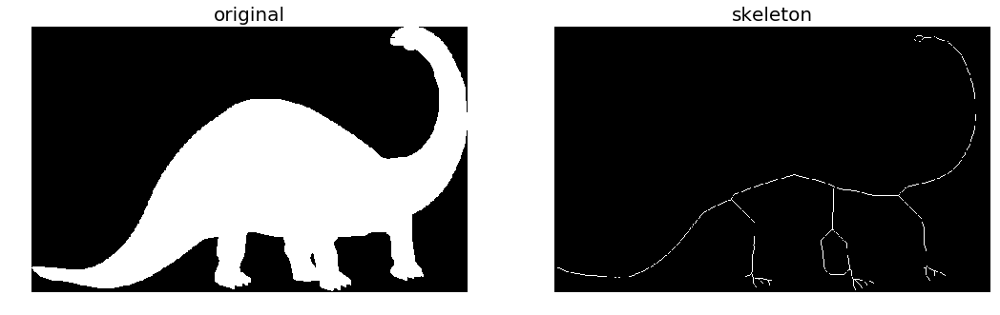

In [492]:
from skimage.morphology import skeletonize
#im = rgb2gray(imread('../new images/letter.jpg'))
im = imread('../new images/dynasaur.png')[...,3] / 255
print(np.max(im))
#im = 1 - im
th = 0.5
im[im < th] = 0
im[im >= th] = 1
#im1 = opening(im, square(6))
skeleton = skeletonize(im)
#skeleton = closing(skeleton, disk(10))
plot_images_side_by_side(im, skeleton, 'skeleton',sz=(18,9))

1.0


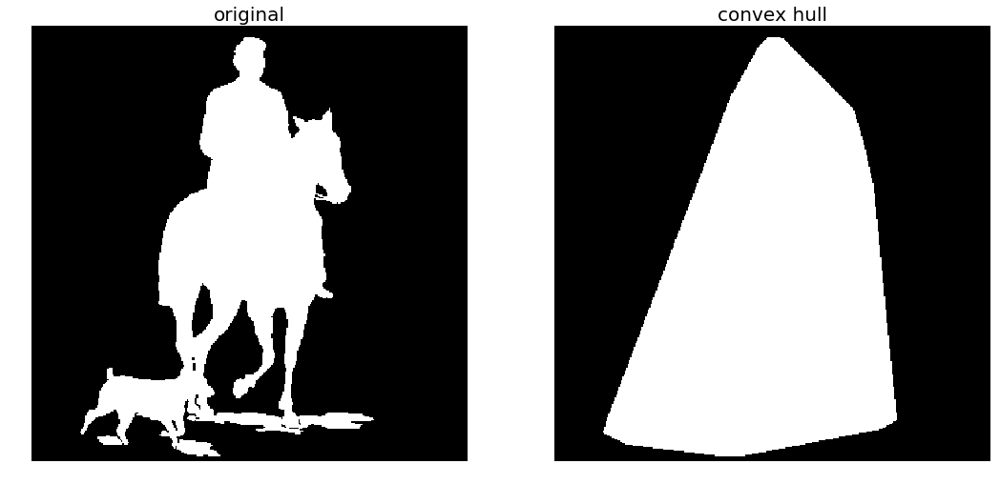

In [88]:
from skimage.morphology import convex_hull_image
from skimage.util import invert
im = rgb2gray(imread('../new images/horse-dog.jpg'))
#im = imread('../new images/dynasaurs.png')[...,3] / 255
print(np.max(im))
#im = 1 - im
th = 0.5
im[im < th] = 0
im[im >= th] = 1
#im1 = opening(im, square(6))
chull = convex_hull_image(im)
#im2 = closing(im, square(1))
plot_images_side_by_side(im, chull, 'convex hull',sz=(18,9))

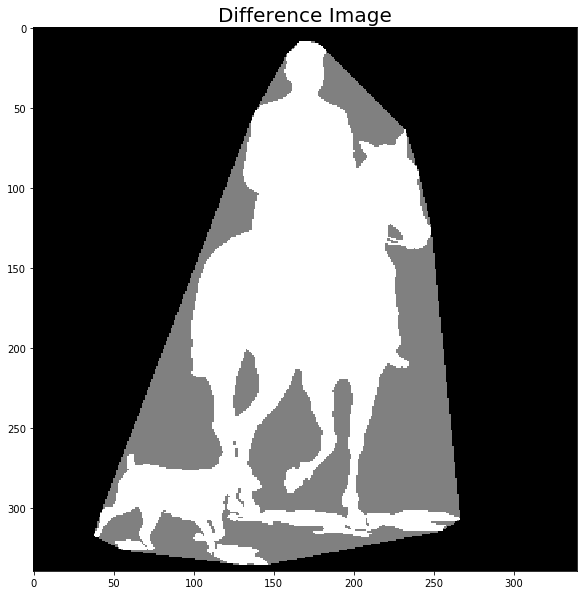

In [95]:
from skimage.util import img_as_float
im = im.astype(np.bool)
chull_diff = img_as_float(chull.copy())
chull_diff[im] = 2

plt.figure(figsize=(20,10))
plt.imshow(chull_diff, cmap=plt.cm.gray, interpolation='nearest')
plt.title('Difference Image', size=20)
plt.show()

1.0


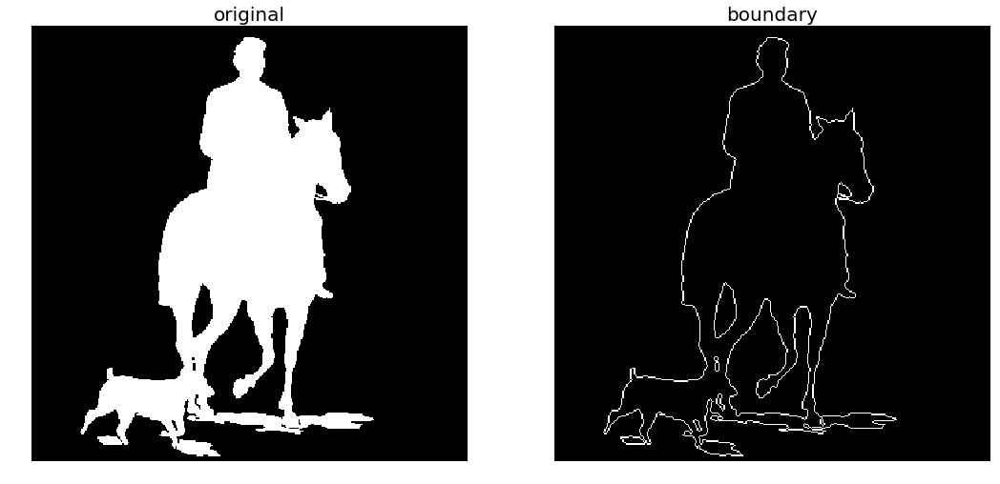

In [686]:
from skimage.morphology import binary_erosion
im = rgb2gray(imread('../new images/horse-dog.jpg'))
#im = imread('../new images/dynasaurs.png')[...,3] / 255
print(np.max(im))
#im = 1 - im
th = 0.5
im[im < th] = 0
im[im >= th] = 1
#im1 = opening(im, square(6))
boundary = im - binary_erosion(im)
#im2 = closing(im, square(1))
plot_images_side_by_side(im, boundary, 'boundary',sz=(18,9))

True False (340, 340)
True
True
True


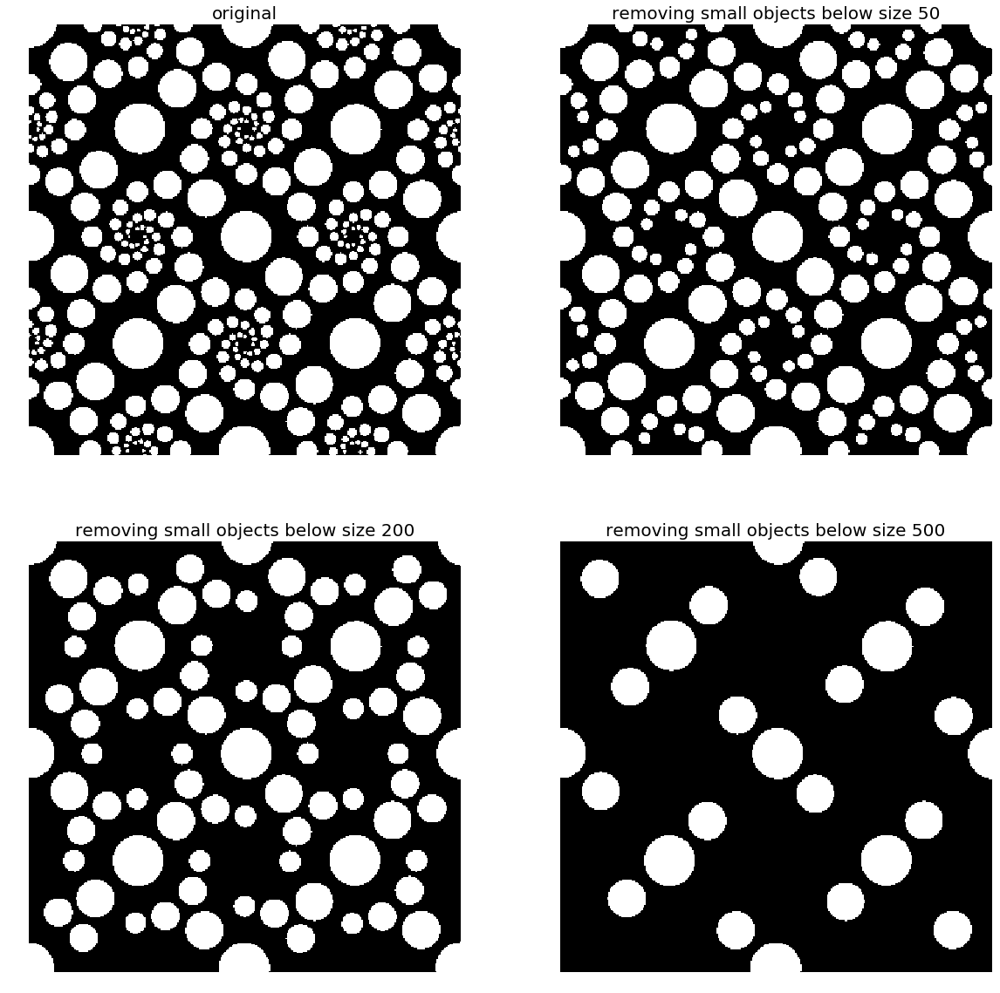

In [750]:
from skimage.morphology import remove_small_objects
im = rgb2gray(imread('../new images/circles.jpg'))
im[im > 0.5] = 1
im[im <= 0.5] = 0
im = im.astype(np.bool)
print(np.max(im), np.min(im), im.shape)
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(im)
plt.axis('off')
plt.title('original', size=20)
i = 2
for osz in [50, 200, 500]:
    im1 = remove_small_objects(im, osz, connectivity=1) #binary_dilation(im, bridge(2))
    print(np.max(im1))
    plt.subplot(2,2,i)
    plt.imshow(im1)
    plt.axis('off')
    plt.title('removing small objects below size ' + str(osz), size=20)
    i += 1
plt.show()    

1.0


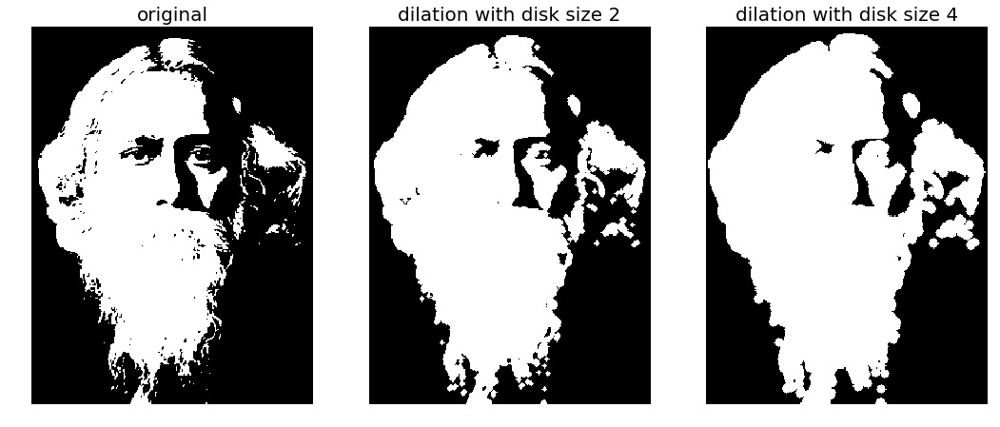

In [583]:
% matplotlib inline
from skimage.morphology import binary_erosion, binary_dilation
im = imread('../new images/tagore.png') / 255
im = 1 - im[...,3]
print(np.max(im))
im[im <= 0.5] = 0
im[im > 0.5] = 1
plt.gray()
plt.figure(figsize=(18,9))
plt.subplot(131)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
for d in range(1,3):
    plt.subplot(1,3,d+1)
    im1 = binary_dilation(im, disk(2*d))
    plt.imshow(im1)
    plt.title('dilation with disk size ' + str(2*d), size=20)
    plt.axis('off')
plt.show()    

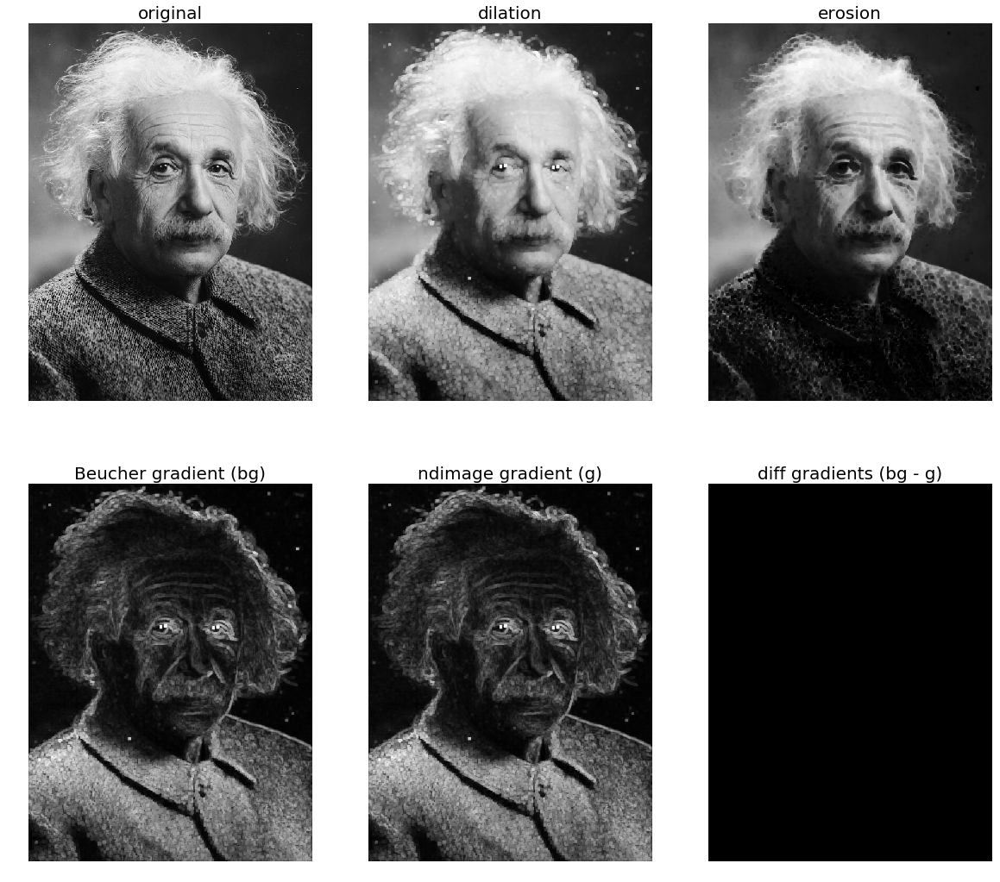

In [666]:
from scipy import ndimage
im = rgb2gray(imread('../new images/einstein.jpg'))
n = 5
im_d = ndimage.grey_dilation(im, size=(n,n))
im_e = ndimage.grey_erosion(im, size=(n,n))
im_bg = im_d - im_e 
im_g = ndimage.morphological_gradient(im, size=(n,n))
plt.gray()
plt.figure(figsize=(20,18))
plt.subplot(231)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(232)
plt.imshow(im_d)
plt.title('dilation', size=20)
plt.axis('off')
plt.subplot(233)
plt.imshow(im_e)
plt.title('erosion', size=20)
plt.axis('off')
plt.subplot(234)
plt.imshow(im_bg)
plt.title('Beucher gradient (bg)', size=20)
plt.axis('off')
plt.subplot(235)
plt.imshow(im_g)
plt.title('ndimage gradient (g)', size=20)
plt.axis('off')
plt.subplot(236)
plt.title('diff gradients (bg - g)', size=20)
plt.imshow(im_bg - im_g)
plt.axis('off')
plt.show()

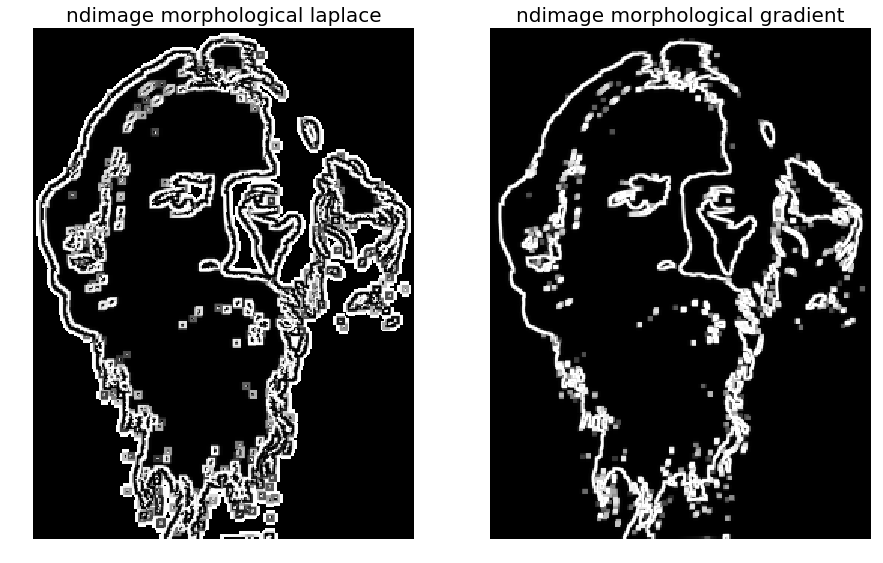

In [670]:
im = imread('../new images/tagore.png')[...,3]
im_g = ndimage.morphological_gradient(im, size=(3,3))
im_l = ndimage.morphological_laplace(im, size=(5,5))
plt.figure(figsize=(15,10))
plt.subplot(121)
plt.title('ndimage morphological laplace', size=20)
plt.imshow(im_l)
plt.axis('off')
plt.subplot(122)
plt.title('ndimage morphological gradient', size=20)
plt.imshow(im_g)
plt.axis('off')
plt.show()

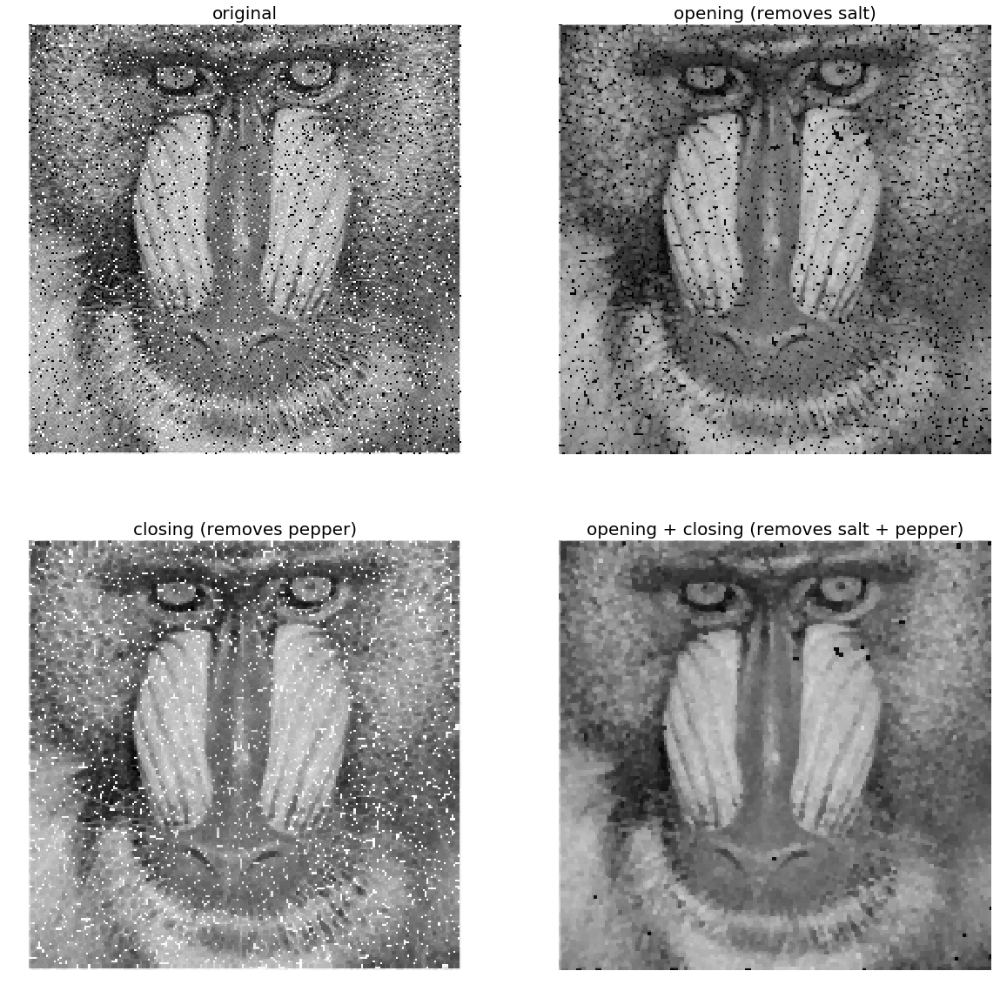

In [684]:
im = rgb2gray(imread('../images/mandrill_spnoise_0.1.jpg'))
im_o = ndimage.grey_opening(im, size=(2,2))
im_c = ndimage.grey_closing(im, size=(2,2))
im_oc = ndimage.grey_closing(ndimage.grey_opening(im, size=(2,2)), size=(2,2))
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(222)
plt.imshow(im_o)
plt.title('opening (removes salt)', size=20)
plt.axis('off')
plt.subplot(223)
plt.imshow(im_c)
plt.title('closing (removes pepper)', size=20)
plt.axis('off')
plt.subplot(224)
plt.imshow(im_oc)
plt.title('opening + closing (removes salt + pepper)', size=20)
plt.axis('off')
plt.show()

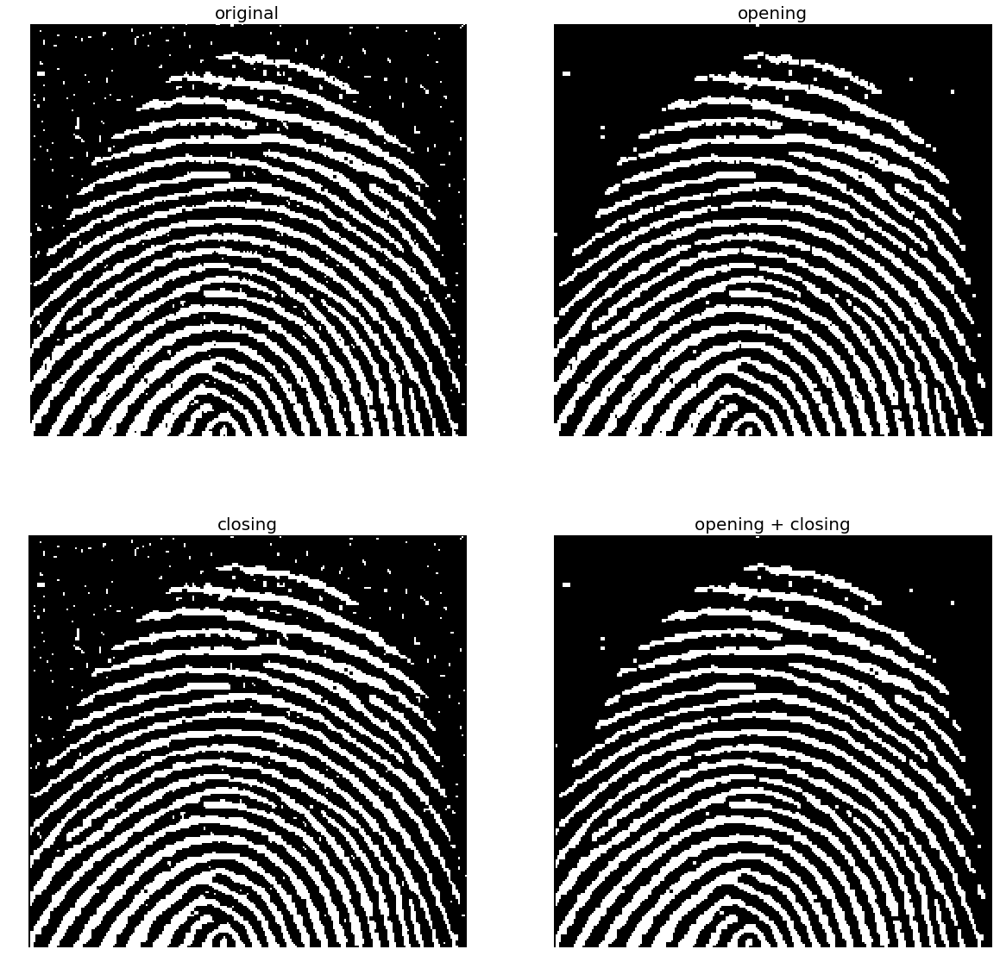

In [714]:
im = rgb2gray(imread('../new images/fingerprint.jpg'))
#im = imread('../new images/fingerprint.png')[...,3]
im[im <= 0.5] = 0
im[im > 0.5] = 1
im_o = binary_opening(im, square(2))
im_c = binary_closing(im, square(2))
im_oc = binary_closing(binary_opening(im, square(2)), square(2))
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(222)
plt.imshow(im_o)
plt.title('opening', size=20)
plt.axis('off')
plt.subplot(223)
plt.imshow(im_c)
plt.title('closing', size=20)
plt.axis('off')
plt.subplot(224)
plt.imshow(im_oc)
plt.title('opening + closing', size=20)
plt.axis('off')
plt.show()

1.0


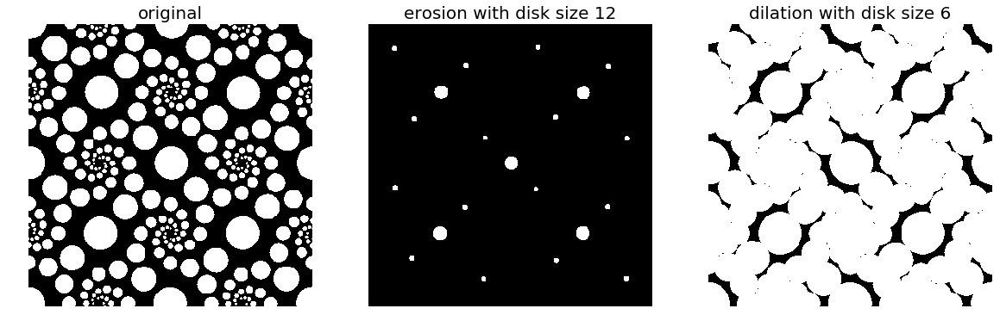

In [608]:
from skimage.morphology import binary_opening, binary_closing, disk
im = rgb2gray(imread('../new images/circles.jpg'))
print(np.max(im))
im[im <= 0.5] = 0
im[im > 0.5] = 1
plt.gray()
plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(1,3,2)
#im1 = binary_opening(im, disk(12))
im1 = binary_erosion(im, disk(12))
plt.imshow(im1)
plt.title('erosion with disk size ' + str(12), size=20)
plt.axis('off')
plt.subplot(1,3,3)
#im1 = binary_closing(im, disk(6))
im1 = binary_dilation(im, disk(6))
plt.imshow(im1)
plt.title('dilation with disk size ' + str(6), size=20)
plt.axis('off')
plt.show()    

1.0


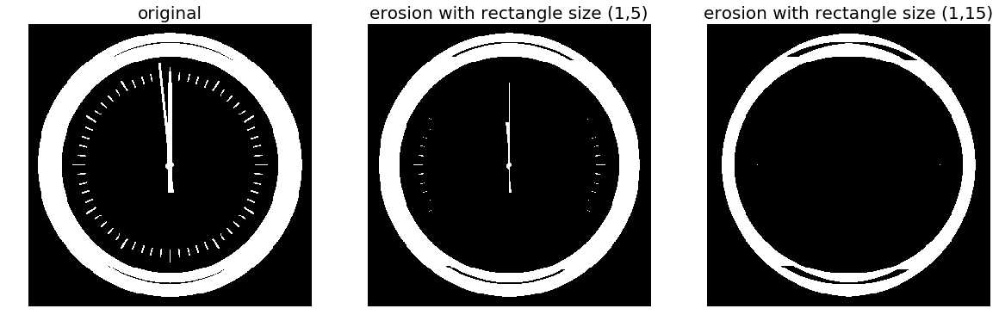

In [619]:
from skimage.morphology import binary_erosion, rectangle
im = rgb2gray(imread('../new images/clock2.jpg'))
print(np.max(im))
im[im <= 0.5] = 0
im[im > 0.5] = 1
plt.gray()
plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(1,3,2)
#im1 = binary_opening(im, disk(12))
im1 = binary_erosion(im, rectangle(1,5))
plt.imshow(im1)
plt.title('erosion with rectangle size (1,5)', size=20)
plt.axis('off')
plt.subplot(1,3,3)
#im1 = binary_closing(im, disk(6))
im1 = binary_erosion(im, rectangle(1,15))
plt.imshow(im1)
plt.title('erosion with rectangle size (1,15)', size=20)
plt.axis('off')
plt.show()    

In [663]:
a = np.zeros((7,7), dtype=np.int)
a[2:5, 2:5] = 1
print(ndimage.morphological_gradient(a, size=(3,3)))
ndimage.grey_dilation(a, size=(3,3)) - ndimage.grey_erosion(a, size=(3,3))

[[0 0 0 0 0 0 0]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [0 1 1 0 1 1 0]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [0 0 0 0 0 0 0]]


array([[0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0],
       [0, 0, 0, 0, 0, 0, 0]])

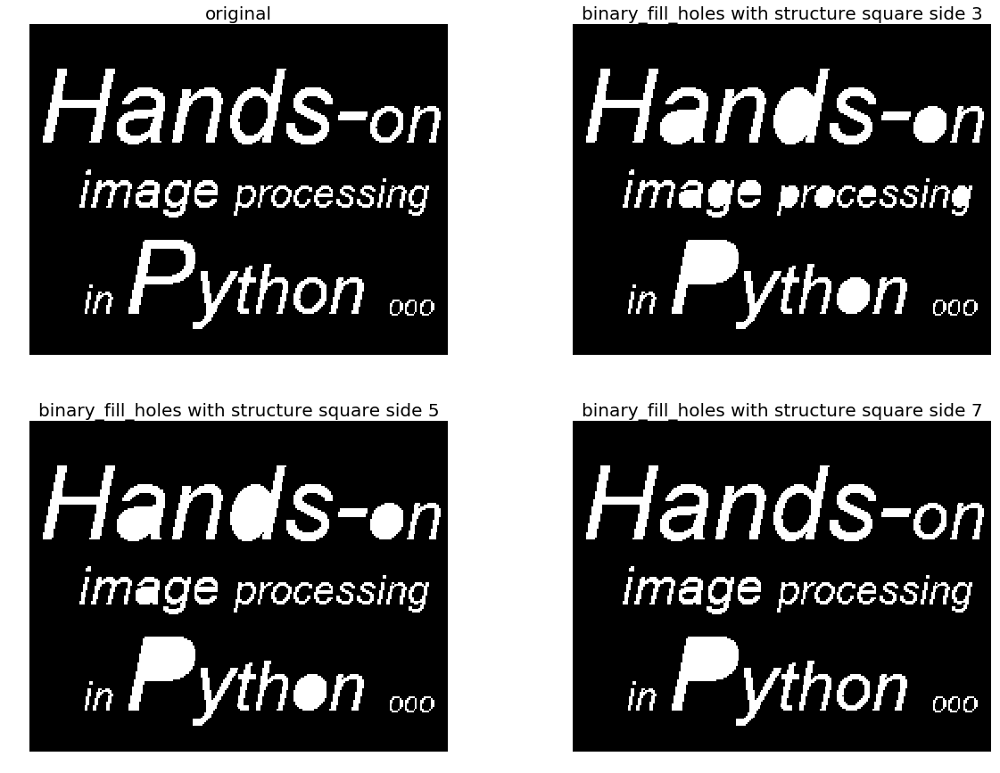

In [768]:
from scipy.ndimage.morphology import binary_fill_holes
im = rgb2gray(imread('../new images/text1.png'))
im[im <= 0.5] = 0
im[im > 0.5] = 1
plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
i = 2
for n in [3,5,7]:
    plt.subplot(2, 2, i)
    im1 = binary_fill_holes(im, structure=np.ones((n,n)))
    plt.imshow(im1)
    plt.title('binary_fill_holes with structure square side ' + str(n), size=20)
    plt.axis('off')
    i += 1
plt.show()

255


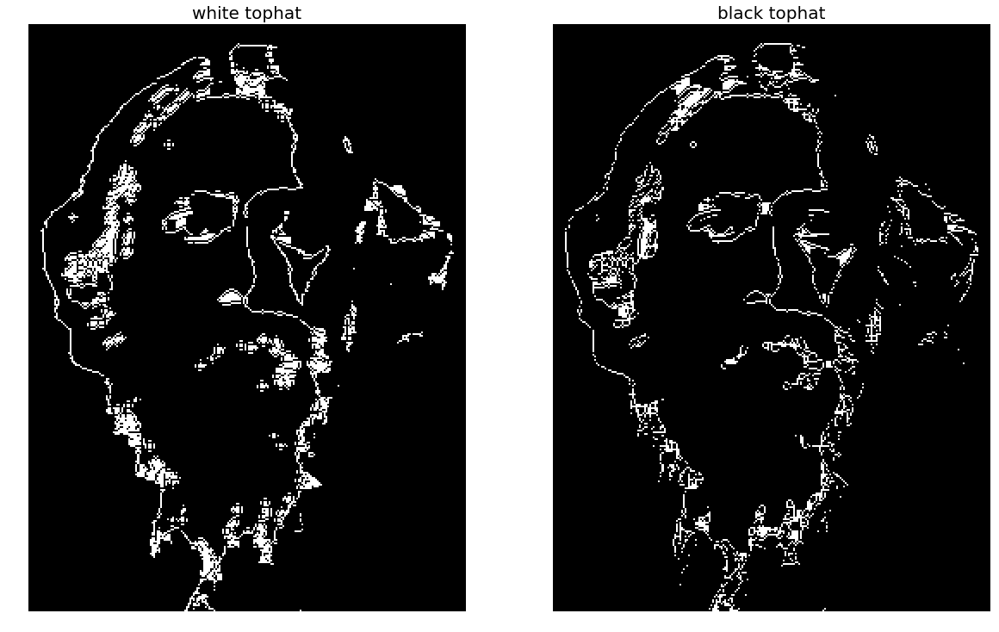

In [787]:
from scipy.ndimage.morphology import binary_fill_holes
im = imread('../new images/tagore.png')[...,3] #/ 255 rgb2gray(
print(np.max(im))
im[im <= 0.5] = 0
im[im > 0.5] = 1
im1 = white_tophat(im, square(5))
im2 = black_tophat(im, square(5))
plt.figure(figsize=(20,15))
plt.subplot(121)
plt.imshow(im1)
plt.title('white tophat', size=20)
plt.axis('off')
plt.subplot(122)
plt.imshow(im2)
plt.title('black tophat', size=20)
plt.axis('off')
plt.show()

estimated noise standard deviation = 0.22048519002358943
float64 float32
PSNR (noisy) = 13.04
PSNR (slow) = 26.25
PSNR (fast) = 25.84


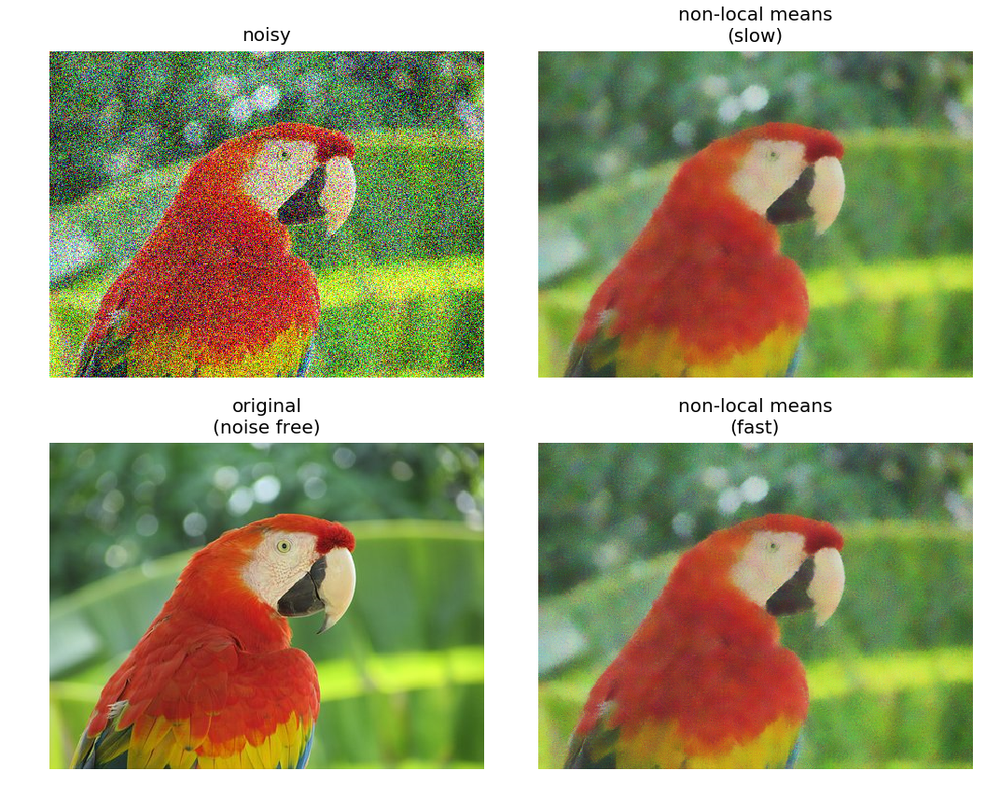

In [140]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, img_as_float
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.measure import compare_psnr


parrot = img_as_float(imread('../new images/parrot.png'))

sigma = 0.25
noisy = parrot + sigma * np.random.standard_normal(parrot.shape)
noisy = np.clip(noisy, 0, 1)

# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("estimated noise standard deviation = {}".format(sigma_est))

patch_kw = dict(patch_size=5,      # 5x5 patches
                patch_distance=6,  # 13x13 search area
                multichannel=True)

# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False, **patch_kw)

# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, fast_mode=True, **patch_kw)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 12), sharex=True, sharey=True)

ax[0, 0].imshow(noisy)
ax[0, 0].axis('off')
ax[0, 0].set_title('noisy', size=20)
ax[0, 1].imshow(denoise)
ax[0, 1].axis('off')
ax[0, 1].set_title('non-local means\n(slow)', size=20)
ax[1, 0].imshow(parrot)
ax[1, 0].axis('off')
ax[1, 0].set_title('original\n(noise free)', size=20)
ax[1, 1].imshow(denoise_fast)
ax[1, 1].axis('off')
ax[1, 1].set_title('non-local means\n(fast)', size=20)

fig.tight_layout()

# print PSNR metric for each case
print(parrot.dtype, denoise.dtype)
psnr_noisy = compare_psnr(parrot, noisy)
psnr = compare_psnr(parrot, denoise.astype(np.float64))
psnr_fast = compare_psnr(parrot, denoise_fast.astype(np.float64))

print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))

plt.show()

1.0


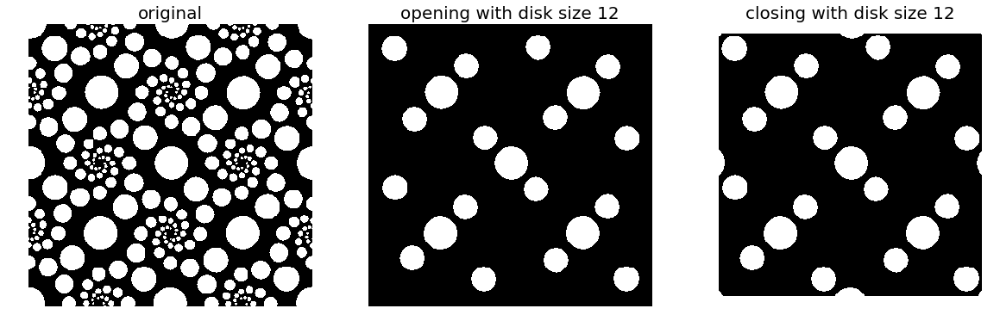

In [144]:
from skimage.morphology import binary_opening, binary_closing, disk
from skimage.util import invert
im = rgb2gray(imread('../new images/circles.jpg'))
print(np.max(im))
im[im <= 0.5] = 0
im[im > 0.5] = 1
plt.gray()
plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(1,3,2)
im1 = binary_opening(im, disk(12))
plt.imshow(im1)
plt.title('opening with disk size ' + str(12), size=20)
plt.axis('off')
plt.subplot(1,3,3)
im1 = invert(binary_closing(invert(im), disk(12)))
plt.imshow(im1)
plt.title('closing with disk size ' + str(12), size=20)
plt.axis('off')
plt.show()

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


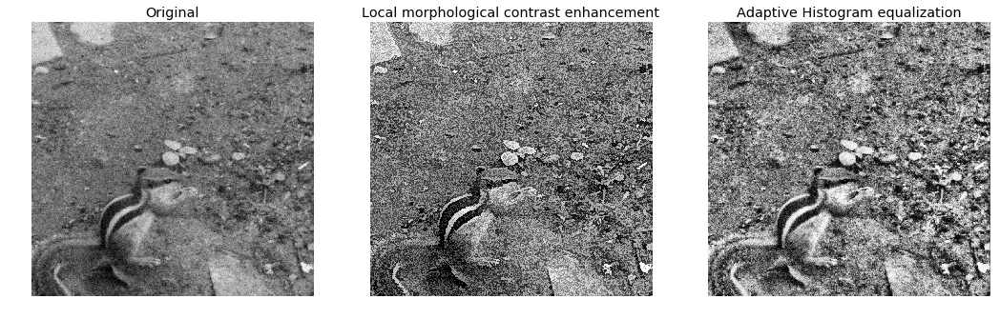

In [253]:
from skimage.filters.rank import enhance_contrast, equalize
from skimage import exposure

image = rgb2gray(imread('../my images/squirrel.jpg')) 
sigma = 0.05
noisy_image = np.clip(image + sigma * np.random.standard_normal(image.shape), 0, 1)
enh = enhance_contrast(noisy_image, disk(5))
leq = equalize(noisy_image, disk(5))
eq = exposure.equalize_adapthist(noisy_image)
geq = exposure.equalize_hist(noisy_image)

fig, ax = plt.subplots(1, 3, figsize=[18, 14], sharex='row', sharey='row')
ax1, ax2, ax3 = ax.ravel()

ax1.imshow(noisy_image, cmap=plt.cm.gray)
ax1.set_title('Original')
ax1.axis('off')
ax1.set_adjustable('box-forced')

ax2.imshow(enh, cmap=plt.cm.gray)
ax2.set_title('Local morphological contrast enhancement')
ax2.axis('off')
ax2.set_adjustable('box-forced')

ax3.imshow(eq, cmap=plt.cm.gray)
ax3.set_title('Adaptive Histogram equalization')
ax3.axis('off')
ax3.set_adjustable('box-forced')

243


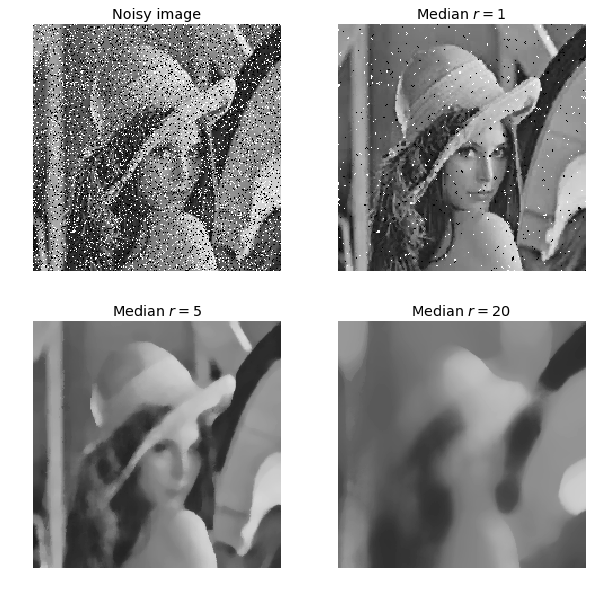

In [182]:
from skimage.filters.rank import median
from skimage.morphology import disk

noisy_image = (rgb2gray(imread('../new images/lena.jpg'))*255).astype(np.uint8)
print(np.max(noisy_image))
noise = np.random.random(noisy_image.shape)
noisy_image[noise > 0.9] = 255
noisy_image[noise < 0.1] = 0

fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)
ax1, ax2, ax3, ax4 = ax.ravel()

ax1.imshow(noisy_image, vmin=0, vmax=255, cmap=plt.cm.gray)
ax1.set_title('Noisy image')
ax1.axis('off')
ax1.set_adjustable('box-forced')

ax2.imshow(median(noisy_image, disk(1)), vmin=0, vmax=255, cmap=plt.cm.gray)
ax2.set_title('Median $r=1$')
ax2.axis('off')
ax2.set_adjustable('box-forced')


ax3.imshow(median(noisy_image, disk(5)), vmin=0, vmax=255, cmap=plt.cm.gray)
ax3.set_title('Median $r=5$')
ax3.axis('off')
ax3.set_adjustable('box-forced')


ax4.imshow(median(noisy_image, disk(20)), vmin=0, vmax=255, cmap=plt.cm.gray)
ax4.set_title('Median $r=20$')
ax4.axis('off')
ax4.set_adjustable('box-forced')

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


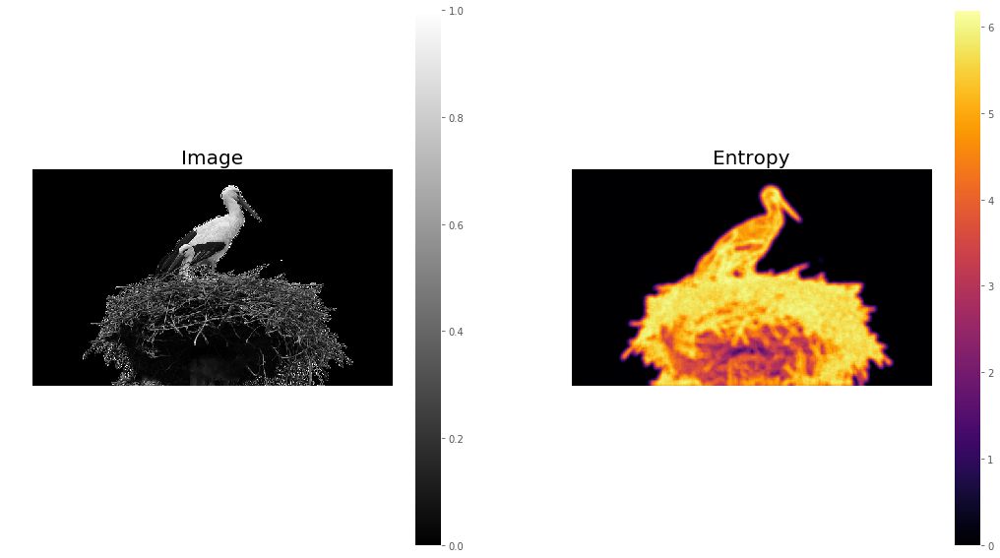

In [196]:
from skimage.filters.rank import entropy
from skimage.morphology import disk
import numpy as np
import matplotlib.pyplot as plt

image = rgb2gray(imread('../new images/birds.png'))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10), sharex=True, sharey=True)

fig.colorbar(ax1.imshow(image, cmap=plt.cm.gray), ax=ax1)
ax1.set_title('Image', size=20)
ax1.axis('off')
ax1.set_adjustable('box-forced')

fig.colorbar(ax2.imshow(entropy(image, disk(5)), cmap=plt.cm.inferno), ax=ax2)
ax2.set_title('Entropy', size=20)
ax2.axis('off')
ax2.set_adjustable('box-forced')

In [ ]:
from scipy import ndimage, misc
import matplotlib.pyplot as plt
lena = misc.imread('../images/lena.jpg')
noise = np.random.random(lena.shape)
lena[noise > 0.9] = 255
lena[noise < 0.1] = 0
plt.imshow(lena)
plt.title('noisy image', size=20)
plt.axis('off')
plt.show()
fig = plt.figure(figsize=(20,15))
i = 1
for p in range(25, 100, 25):
    for k in range(5, 25, 5):
        plt.subplot(3,4,i)
        result = ndimage.percentile_filter(lena, percentile=p, size=(k,k,1))
        plt.imshow(result)
        plt.title(str(p) + ' percentile, ' + str(k) + 'x' + str(k) + ' kernel', size=20)
        plt.axis('off')
        i += 1
plt.show()